In [1]:
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import pprint
import os
from shutil import copyfile
from tqdm.notebook import tqdm
import pandas as pd
import h5py
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage.io import imread
from skimage.util import img_as_float, img_as_ubyte
from skimage.color import rgb2gray
from skimage.filters import unsharp_mask

import numpy as np
import scipy
import scipy.ndimage as ndimage
import scipy.ndimage.filters as filters
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model

# test model performance
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
from sklearn.feature_extraction.image import extract_patches_2d

import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5*1024)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


# Load data

In [2]:
def random_crop(x, y, size, number, dims=1):
    x_result = None
    y_result = None
    max_index = len(x)
    
    
    for i in tqdm(range(max_index)):
        final_number = int(float(x[i].shape[0] * x[i].shape[1]) / (400. * 400.) * float(number))

        x_crop = extract_patches_2d(x[i], (size,size), final_number, i*100)
        y_crop = extract_patches_2d(y[i], (size,size), final_number, i*100)
                
        
        if x_result is None:
            x_result = x_crop
            y_result = y_crop
        else:
            x_result = np.concatenate((x_result, x_crop))
            y_result = np.concatenate((y_result, y_crop))
    
    x_result = np.expand_dims(x_result, axis=-1)
    y_result = np.expand_dims(y_result, axis=-1)
    return x_result, y_result

def preprocess_data(img_data, mask_data, train_index, val_index, size=128):
    train_data = []
    train_mask = []

    val_data = []
    val_mask = []
    
    for index in train_index:
        train_data.append(img_data[index])
        train_mask.append(mask_data[index])
    
    for index in val_index:
        val_data.append(img_data[index])
        val_mask.append(mask_data[index])
        
    X_train, y_train = random_crop(train_data, train_mask, size, 100)
    X_val, y_val = random_crop(val_data, val_mask, size, 100)

    batch_size = 32

    data_gen_args = dict(featurewise_center=True, featurewise_std_normalization=True, horizontal_flip=True,
                        vertical_flip=True, rotation_range=180)
    mask_gen_args = dict(horizontal_flip=True, vertical_flip=True, rotation_range=180)
    image_datagen = ImageDataGenerator(**data_gen_args)
    mask_datagen = ImageDataGenerator(**mask_gen_args)
    image_datagen.fit(X_train)
    mask_datagen.fit(y_train)
    seed = 100
    image_generator = image_datagen.flow(X_train, seed=seed, batch_size=batch_size, shuffle=True)
    mask_generator = mask_datagen.flow(y_train, seed=seed, batch_size=batch_size, shuffle=True)
    train_generator = (pair for pair in zip(image_generator, mask_generator))

    val_data_gen_args = dict(featurewise_center=True, featurewise_std_normalization=True, horizontal_flip=True,
                        vertical_flip=True, rotation_range=180)
    val_mask_gen_args = dict(horizontal_flip=True, vertical_flip=True, rotation_range=180)
    val_image_datagen = ImageDataGenerator(**val_data_gen_args)
    val_mask_datagen = ImageDataGenerator(**val_mask_gen_args)
    val_image_datagen.fit(X_val)
    val_mask_datagen.fit(y_val)
    seed = 100
    val_image_generator = val_image_datagen.flow(X_val, seed=seed, batch_size=32, shuffle=True)
    val_mask_generator = val_mask_datagen.flow(y_val, seed=seed, batch_size=32, shuffle=True)
    val_generator = (pair for pair in zip(val_image_generator, val_mask_generator))
    
    return train_generator, val_generator, len(X_train), len(X_val)

In [3]:
from tensorflow.keras import optimizers, initializers, regularizers
from tensorflow.python.ops import array_ops, math_ops
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau

def prepare_vnet_encoder(config, inputs, trainable=True):
    prev_output = inputs
    regularizer = regularizers.l2(0.001)
    save_layers = []
    
    
    for i in range(len(config)):
        layer_prev_output = prev_output
        for j in range(config[i][1]):
            c = layers.Conv2D(config[i][0], (5, 5), kernel_initializer='he_normal',
                              trainable=trainable, kernel_regularizer=regularizer,
                              padding='same', name='dw_c{}_{}'.format(i, j))(prev_output)
            
            # skip connection
            if j == config[i][1] - 1 and i != 0:
                c = layers.Add()([c, layer_prev_output])
              
            c = layers.Activation('elu')(c)
            c = tf.keras.layers.BatchNormalization()(c)
                
            prev_output = c
        
        # down convolution
        if i != len(config) -1:
            save_layers.append(c)
            c = layers.Conv2D(config[i][0] * 2, (2, 2), strides=2, kernel_initializer='he_normal',
                              trainable=trainable, kernel_regularizer=regularizer, activation='elu',
                              padding='same', name='p_cd{}_{}'.format(i, j))(c)
            c = tf.keras.layers.BatchNormalization()(c)
            prev_output = c
    
    return prev_output, save_layers
        
def prepare_vnet_decoder(config, inputs, skip_layers, trainable=True):
    prev_output = inputs
    regularizer = regularizers.l2(0.001)
    
    for i in range(len(config)):
        # up deconvolution
        u = layers.Conv2DTranspose(config[i][0], (2, 2), strides=(2, 2), activation='elu',
                                   kernel_initializer='he_normal', trainable=trainable,
                                   padding='same', name='up_u{}_1'.format(i))(prev_output)
        u = tf.keras.layers.BatchNormalization()(u)
        layer_prev_output = u
        prev_output = u        
        for j in range(config[i][1]):
            # long skip connection
            if j == 0:
                c = layers.concatenate([prev_output, skip_layers[-(i+1)]])
            else:
                c = prev_output

            c = layers.Conv2D(config[i][0], (5, 5), kernel_initializer='he_normal', trainable=trainable,
                            kernel_regularizer=regularizer, padding='same', name='up_cd{}_{}'.format(i, j))(c)
            
            # short skip connection
            if j == config[i][1] -1:
                c = layers.Add()([c, layer_prev_output])
            
            c = layers.Activation('elu')(c)
            c = tf.keras.layers.BatchNormalization()(c)
                
        prev_output = c
        
    return prev_output
        
def prepare_vnet(config, weight_path=None):
    input_shape = config['input_size']
    output_size = config['output_size']
    loss_function = config['loss_function']
    

    #Build the model
    inputs = tf.keras.layers.Input(input_shape)
    
    encoder_config = [[16, 1], [32, 2], [64, 3], [128, 3], [256, 3]]
    encoder, skip_layers = prepare_vnet_encoder(encoder_config, inputs)
    
    decoder_config = [[128, 3], [64, 3], [32, 2], [16, 1]]
    decoder = prepare_vnet_decoder(decoder_config, encoder, skip_layers)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(decoder)
    full_model = keras.Model(inputs=inputs,
                             outputs=outputs)

    if weight_path is not None:
        full_model.load_weights(weight_path)

    full_model.compile(optimizer='adam',
                       loss=loss_function,
                       metrics=['mae'])
    return full_model


def dice_coef(y_true, y_pred, smooth=2e-126):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true_f)) + K.sum(K.square(y_pred_f)) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)


def train_model(train_generator, val_generator, train_step, val_step, size=128):
    size = 128

    config={
        "input_size": (size, size, 1),
        "output_size": (size, size, 1),
        "loss_function": dice_coef_loss
    }

    early_stop = keras.callbacks.EarlyStopping(patience=10, monitor='val_loss', restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.1,
                                  patience=3, min_lr=0.000)

    model = None
    model = prepare_vnet(config)
    model.fit(train_generator, steps_per_epoch=int(train_step/32), callbacks=[early_stop, reduce_lr],
                        epochs=1000, validation_data=val_generator, validation_steps=int(val_step/32))
    return model

In [4]:
data_dir = Path('./data/BCD')
df = pd.read_csv(data_dir / 'metadata.csv')

ids = np.unique(df['id'].values)
sharpen_img_dir = data_dir / 'sharpen_area_img'
proximity_img_dir = data_dir / 'proximity_area_map'
original_img_dir = data_dir / 'upscale_area_img'

img_data = []
mask_data = []
coord_data = []
original_img_data = []

for single_id in tqdm(ids, total=len(ids)):
    try:
        single_df = df[df['id'] == single_id]

        centroids = np.transpose(np.stack((single_df['centroid_x'].values, single_df['centroid_y'].values)))
        img = np.array(Image.open(sharpen_img_dir / '{:03d}.jpg'.format(single_id)))
        mask = np.loadtxt(proximity_img_dir / '{:03d}.csv'.format(single_id), delimiter=',')
        original_img = Image.open(original_img_dir / '{:03d}.jpg'.format(single_id))
        original_img = np.array(original_img)
        
        img_data.append(img)
        mask_data.append(mask)
        coord_data.append(centroids)
        original_img_data.append(original_img)

    except:
        continue

for i in range(len(img_data)):
    if img_data[i].shape[-1] < 4:
        img_data[i] = img_data[i][:, :, 0]

In [5]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

indexes = np.arange(0, len(img_data))
kf = KFold(n_splits=10, shuffle=True, random_state=0)
kf.get_n_splits(indexes)

train_indexes = []
val_indexes = []
test_indexes = []

for first_index, second_index in kf.split(indexes):
    train_index, val_index = train_test_split(first_index, test_size = 0.11, shuffle=True, random_state=0)
    test_index = second_index
    
    train_indexes.append(train_index)
    val_indexes.append(val_index)
    test_indexes.append(test_index)
    
for i in range(len(train_indexes)):
    print(train_indexes[i], val_indexes[i], test_indexes[i])

[32 17 13  2 28 34 37 41 39 33 38  9 15  6 19 16  8 31  1 14 29 26  7 25
  5 20 23 21 11 40  3  0] [24 22 18 12 35] [ 4 10 27 30 36]
[32 16 12  2 27 34 36 41 39 33 38  8 14  5 18 15  7 30  1 13 29 26  6 24
  4 19 22 20  9 40  3  0] [23 21 17 10 35] [11 25 28 31 37]
[22 28 11 27  3 34 36 35 41 38 33 37  9 14  6 18 15  8 31  1 13 30 26  7
 25  5 19 23 21 10 40  4  0] [24 32 17 16 12] [ 2 20 29 39]
[23 29 10 28  2 34 36 35 40 38 33 37  8 13  5 19 14  7 31  1 12 30 27  6
 26  4 20 24 21  9 39  3  0] [25 32 17 16 11] [15 18 22 41]
[23 29 11 28  2 34 36 35 41 39 33 37  9 15  5 20 17  7 31  1 14 30 27  6
 26  4 21 24 22 10 40  3  0] [25 32 19 18 12] [ 8 13 16 38]
[23 29 11 28  2 35 37 36 41 39 34 38  9 15  6 20 16  8 31  1 13 30 27  7
 26  4 21 24 22 10 40  3  0] [25 33 19 18 12] [ 5 14 17 32]
[22 28 12 27  3 33 37 36 41 39 32 38 10 15  6 19 16  9 30  2 14 29 26  8
 25  5 20 23 21 11 40  4  0] [24 31 18 17 13] [ 1  7 34 35]
[21 29 10 28  2 35 37 36 41 39 34 38  8 14  5 18 15  7 31  1 13 30 27

In [29]:
count = 1
model_dir = Path('./models')
os.makedirs(model_dir, exist_ok=True)

for train_index, val_index in zip(train_indexes, val_indexes):
    train_generator, val_generator, train_count, val_count = preprocess_data(img_data, mask_data, train_index, val_index, size=128)
    model = train_model(train_generator, val_generator, train_count, val_count, size=128)
    
    model.save(model_dir / 'BCD_model_cv_{}.h5'.format(count))
    count += 1


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 90 steps, validate for 16 steps
Epoch 1/1000
90/90 [==============================] - 8s 92ms/step - loss: 1.6013 - mae: 0.3173 - val_loss: 0.7784 - val_mae: 0.2120
Epoch 2/1000
90/90 [==============================] - 7s 76ms/step - loss: 0.6103 - mae: 0.2286 - val_loss: 0.7861 - val_mae: 0.1676
Epoch 3/1000
90/90 [==============================] - 6s 68ms/step - loss: 0.5198 - mae: 0.2117 - val_loss: 0.7590 - val_mae: 0.4238
Epoch 4/1000
90/90 [==============================] - 6s 64ms/step - loss: 0.4805 - mae: 0.2016 - val_loss: 0.6367 - val_mae: 0.1769
Epoch 5/1000
90/90 [==============================] - 6s 66ms/step - loss: 0.5046 - mae: 0.1996 - val_loss: 0.5994 - val_mae: 0.1784
Epoch 6/1000
90/90 [==============================] - 6s 66ms/step - loss: 0.4519 - mae: 0.1988 - val_loss: 0.5505 - val_mae: 0.1936
Epoch 7/1000
90/90 [==============================] - 6s 66ms/step - loss: 0.4388 - mae: 0.1966 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 98 steps, validate for 13 steps
Epoch 1/1000
98/98 [==============================] - 9s 87ms/step - loss: 1.5584 - mae: 0.3440 - val_loss: 0.7790 - val_mae: 0.1966
Epoch 2/1000
98/98 [==============================] - 6s 66ms/step - loss: 0.6103 - mae: 0.2421 - val_loss: 0.7174 - val_mae: 0.1898
Epoch 3/1000
98/98 [==============================] - 6s 65ms/step - loss: 0.5359 - mae: 0.2113 - val_loss: 0.6327 - val_mae: 0.1829
Epoch 4/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.4916 - mae: 0.2008 - val_loss: 0.7374 - val_mae: 0.1626
Epoch 5/1000
98/98 [==============================] - 6s 62ms/step - loss: 0.4734 - mae: 0.1984 - val_loss: 0.5317 - val_mae: 0.1853
Epoch 6/1000
98/98 [==============================] - 6s 64ms/step - loss: 0.4691 - mae: 0.2008 - val_loss: 0.4974 - val_mae: 0.2021
Epoch 7/1000
98/98 [==============================] - 6s 66ms/step - loss: 0.4748 - mae: 0.2002 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 93 steps, validate for 15 steps
Epoch 1/1000
93/93 [==============================] - 8s 88ms/step - loss: 1.5710 - mae: 0.3138 - val_loss: 0.8310 - val_mae: 0.2252
Epoch 2/1000
93/93 [==============================] - 6s 67ms/step - loss: 0.6221 - mae: 0.2372 - val_loss: 0.7136 - val_mae: 0.1734
Epoch 3/1000
93/93 [==============================] - 6s 68ms/step - loss: 0.5187 - mae: 0.2186 - val_loss: 0.6490 - val_mae: 0.1900
Epoch 4/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.4858 - mae: 0.2125 - val_loss: 0.6285 - val_mae: 0.1784
Epoch 5/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.4785 - mae: 0.2058 - val_loss: 0.5759 - val_mae: 0.1926
Epoch 6/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.4530 - mae: 0.2050 - val_loss: 0.5668 - val_mae: 0.1915
Epoch 7/1000
93/93 [==============================] - 6s 68ms/step - loss: 0.4466 - mae: 0.2056 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 93 steps, validate for 15 steps
Epoch 1/1000
93/93 [==============================] - 8s 90ms/step - loss: 1.6307 - mae: 0.2961 - val_loss: 0.8425 - val_mae: 0.2187
Epoch 2/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.6163 - mae: 0.2223 - val_loss: 0.7317 - val_mae: 0.1776
Epoch 3/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.5174 - mae: 0.2113 - val_loss: 0.7265 - val_mae: 0.1645
Epoch 4/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.4759 - mae: 0.2047 - val_loss: 0.5319 - val_mae: 0.1845
Epoch 5/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.4667 - mae: 0.2041 - val_loss: 0.5198 - val_mae: 0.1969
Epoch 6/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.4459 - mae: 0.2020 - val_loss: 0.5129 - val_mae: 0.1828
Epoch 7/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.4562 - mae: 0.2046 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 96 steps, validate for 15 steps
Epoch 1/1000
96/96 [==============================] - 8s 85ms/step - loss: 1.5534 - mae: 0.3269 - val_loss: 0.7229 - val_mae: 0.1872
Epoch 2/1000
96/96 [==============================] - 7s 68ms/step - loss: 0.5968 - mae: 0.2325 - val_loss: 0.7217 - val_mae: 0.1774
Epoch 3/1000
96/96 [==============================] - 6s 63ms/step - loss: 0.5125 - mae: 0.2111 - val_loss: 0.6567 - val_mae: 0.1735
Epoch 4/1000
96/96 [==============================] - 6s 63ms/step - loss: 0.4723 - mae: 0.2020 - val_loss: 0.5612 - val_mae: 0.1838
Epoch 5/1000
96/96 [==============================] - 6s 63ms/step - loss: 0.4734 - mae: 0.2033 - val_loss: 0.5832 - val_mae: 0.1882
Epoch 6/1000
96/96 [==============================] - 6s 63ms/step - loss: 0.4503 - mae: 0.1997 - val_loss: 0.5188 - val_mae: 0.1689
Epoch 7/1000
96/96 [==============================] - 6s 63ms/step - loss: 0.4497 - mae: 0.2009 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 92 steps, validate for 16 steps
Epoch 1/1000
92/92 [==============================] - 8s 86ms/step - loss: 1.6664 - mae: 0.3049 - val_loss: 0.7960 - val_mae: 0.2225
Epoch 2/1000
92/92 [==============================] - 6s 65ms/step - loss: 0.6274 - mae: 0.2270 - val_loss: 0.7071 - val_mae: 0.1695
Epoch 3/1000
92/92 [==============================] - 6s 63ms/step - loss: 0.5229 - mae: 0.2156 - val_loss: 0.7598 - val_mae: 0.1666
Epoch 4/1000
92/92 [==============================] - 6s 63ms/step - loss: 0.4829 - mae: 0.2068 - val_loss: 0.5325 - val_mae: 0.2142
Epoch 5/1000
92/92 [==============================] - 6s 63ms/step - loss: 0.5399 - mae: 0.2074 - val_loss: 0.5988 - val_mae: 0.1813
Epoch 6/1000
92/92 [==============================] - 6s 63ms/step - loss: 0.4556 - mae: 0.2034 - val_loss: 0.5817 - val_mae: 0.1788
Epoch 7/1000
92/92 [==============================] - 6s 63ms/step - loss: 0.4420 - mae: 0.2007 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 93 steps, validate for 18 steps
Epoch 1/1000
93/93 [==============================] - 8s 87ms/step - loss: 1.6232 - mae: 0.3019 - val_loss: 0.8719 - val_mae: 0.1796
Epoch 2/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.6231 - mae: 0.2270 - val_loss: 0.7145 - val_mae: 0.1774
Epoch 3/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.5191 - mae: 0.2110 - val_loss: 0.6603 - val_mae: 0.1875
Epoch 4/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.5026 - mae: 0.2048 - val_loss: 0.6174 - val_mae: 0.1850
Epoch 5/1000
93/93 [==============================] - 6s 64ms/step - loss: 0.4672 - mae: 0.2025 - val_loss: 0.6335 - val_mae: 0.1669
Epoch 6/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.4569 - mae: 0.2016 - val_loss: 0.5864 - val_mae: 0.1799
Epoch 7/1000
93/93 [==============================] - 6s 65ms/step - loss: 0.4584 - mae: 0.2023 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 98 steps, validate for 13 steps
Epoch 1/1000
98/98 [==============================] - 8s 83ms/step - loss: 1.5347 - mae: 0.3129 - val_loss: 0.8172 - val_mae: 0.2683
Epoch 2/1000
98/98 [==============================] - 6s 63ms/step - loss: 0.6151 - mae: 0.2281 - val_loss: 0.7056 - val_mae: 0.2004
Epoch 3/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.5231 - mae: 0.2122 - val_loss: 0.6496 - val_mae: 0.1959
Epoch 4/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.4935 - mae: 0.2089 - val_loss: 0.6381 - val_mae: 0.1759
Epoch 5/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.4683 - mae: 0.2036 - val_loss: 0.6007 - val_mae: 0.1754
Epoch 6/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.4798 - mae: 0.2063 - val_loss: 0.5671 - val_mae: 0.1946
Epoch 7/1000
98/98 [==============================] - 6s 61ms/step - loss: 0.5177 - mae: 0.2095 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 97 steps, validate for 15 steps
Epoch 1/1000
97/97 [==============================] - 9s 88ms/step - loss: 1.5489 - mae: 0.3218 - val_loss: 0.8263 - val_mae: 0.2746
Epoch 2/1000
97/97 [==============================] - 7s 68ms/step - loss: 0.5913 - mae: 0.2316 - val_loss: 0.7222 - val_mae: 0.1962
Epoch 3/1000
97/97 [==============================] - 6s 62ms/step - loss: 0.5050 - mae: 0.2119 - val_loss: 0.7371 - val_mae: 0.1425
Epoch 4/1000
97/97 [==============================] - 6s 63ms/step - loss: 0.4876 - mae: 0.2033 - val_loss: 0.6406 - val_mae: 0.1661
Epoch 5/1000
97/97 [==============================] - 6s 63ms/step - loss: 0.4621 - mae: 0.2013 - val_loss: 0.5307 - val_mae: 0.1903
Epoch 6/1000
97/97 [==============================] - 6s 62ms/step - loss: 0.4513 - mae: 0.2009 - val_loss: 0.5866 - val_mae: 0.1689
Epoch 7/1000
97/97 [==============================] - 6s 66ms/step - loss: 0.4742 - mae: 0.2034 - val_loss: 0


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 94 steps, validate for 17 steps
Epoch 1/1000
94/94 [==============================] - 8s 86ms/step - loss: 1.5694 - mae: 0.3242 - val_loss: 0.8669 - val_mae: 0.3491
Epoch 2/1000
94/94 [==============================] - 6s 66ms/step - loss: 0.6151 - mae: 0.2317 - val_loss: 0.8230 - val_mae: 0.1481
Epoch 3/1000
94/94 [==============================] - 6s 63ms/step - loss: 0.5218 - mae: 0.2146 - val_loss: 0.6312 - val_mae: 0.1750
Epoch 4/1000
94/94 [==============================] - 6s 63ms/step - loss: 0.4769 - mae: 0.2050 - val_loss: 0.6439 - val_mae: 0.1693
Epoch 5/1000
94/94 [==============================] - 6s 64ms/step - loss: 0.4597 - mae: 0.2032 - val_loss: 0.5746 - val_mae: 0.1814
Epoch 6/1000
94/94 [==============================] - 6s 63ms/step - loss: 0.4754 - mae: 0.2065 - val_loss: 0.6142 - val_mae: 0.1661
Epoch 7/1000
94/94 [==============================] - 6s 64ms/step - loss: 0.4518 - mae: 0.2027 - val_loss: 0

In [34]:
import time
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from scipy.spatial import distance

def generate_image_patches(img, size):
    max_x = int(np.ceil(img.shape[0]/ size))
    max_y = int(np.ceil(img.shape[1]/ size))
    
    if max_x == 1:
        x_interval = 0
    else:
        x_interval = ((img.shape[0] - size/2.) - (size/2.)) / (max_x-1)
    
    if max_y == 1:
        y_interval = 0
    else:
        y_interval = ((img.shape[1] - size/2.) - (size/2.)) / (max_y-1)
    
    center_coords = []
    
    for i in range(max_x):
        for j in range(max_y):
            if i == 0:
                x = int(size/2.)
            elif i == max_x - 1:
                x = int(img.shape[0] - size/2.)
            else:
                x = int(size/2. + i * x_interval)
            
            if j == 0:
                y = int(size/2.)
            elif j == max_y -1:
                y = int(img.shape[1] - size/2.)
            else:
                y = int(size/2. + j * y_interval)
                
            center_coords.append([x,y])
            
    ones_array = np.full((size, size), 1.)
    weight_array = np.full((img.shape), 0.)

    image_patches = []
    for i in range(len(center_coords)):
        weight_array[center_coords[i][0] - int(size/2.): center_coords[i][0] + int(size/2.), center_coords[i][1] - int(size/2.): center_coords[i][1] + int(size/2.)] += ones_array
        image_patches.append(img[center_coords[i][0] - int(size/2.): center_coords[i][0] + int(size/2.), center_coords[i][1] - int(size/2.): center_coords[i][1] + int(size/2.)])
        
    weight_array = 1./weight_array
    
    return image_patches, center_coords, weight_array

def reconstruct_image_patches(image_patches, center_coords, size, weight_array):
    reconstruct_img = np.full(weight_array.shape, 0.)
    for i in range(len(image_patches)):
        reconstruct_img[center_coords[i][0] - int(size/2.): center_coords[i][0] + int(size/2.),
                   center_coords[i][1] - int(size/2.): center_coords[i][1] + int(size/2.)] += image_patches[i]
    
    reconstruct_img = np.multiply(reconstruct_img, weight_array)
    return reconstruct_img

def dist2(p1, p2):
    return (p1[0]-p2[0])**2 + (p1[1]-p2[1])**2

def fuse(points, d):
    ret = []
    d2 = d * d
    n = len(points)
    taken = [False] * n
    for i in range(n):
        if not taken[i]:
            count = 1
            point = [points[i][0], points[i][1]]
            taken[i] = True
            for j in range(i+1, n):
                if dist2(points[i], points[j]) < d2:
                    point[0] += points[j][0]
                    point[1] += points[j][1]
                    count+=1
                    taken[j] = True
            point[0] /= count
            point[1] /= count
            ret.append((point[0], point[1]))
    ret = np.array(ret)
    return ret

def remove_edge_point(points, size, threshold=5.):
    result = []
    for i in points:
        if i[0] <= threshold or i[1] <= threshold or i[0] >= size[1]-threshold-1 or i[1] >= size[0]-threshold-1:
            continue
        result.append(i)
    return np.array(result)



def closest_node(node, nodes):
    closest_index = distance.cdist([node], nodes).argmin()
    return closest_index

def calculate_average_neareast_distance(y_pred, y_true, duplicate=True):
    distance = []
    holder = y_true.copy()
    holder[:, [0,1]] = holder[:, [1,0]]
    for i in range(len(y_pred)):
        if(len(holder) == 0):
            break
        index = closest_node(y_pred[i], holder)
        distance.append(np.linalg.norm(y_pred[i] - holder[index]))
        
        if not duplicate:
            holder = np.delete(holder, index, axis=0)
    
    print(np.mean(distance), np.min(distance), np.max(distance))
    return np.mean(distance)

def full_test(sample_num, data_path, patch_size, graph=False):
    with h5py.File(data_path, 'r') as file:
        image_patches = file.get('predict_patches/{:03}'.format(sample_num))[:]
        image_patches = np.reshape(image_patches, (len(image_patches), patch_size, patch_size))
        original_img = file.get('original/{:03}'.format(sample_num))[:]
        if len(original_img.shape) > 2:
            original_img = original_img[:, : ,0]
        
        processed_img = file.get('processed/{:03}'.format(sample_num))[:]

        ground_truth = file.get('ground_truth/{:03}'.format(sample_num))[:]
        xy_offset = file.get('xy_offset/{:03}'.format(sample_num))[:]
        
    centroid_locs = np.argwhere(ground_truth == 1.0)
    centroid_num = len(centroid_locs)
    
    neighborhood_size = 12
    threshold = 0.15

    global_coords = []
    
    
    for i in range(len(image_patches)):
        data = image_patches[i]
        data_max = filters.maximum_filter(data, neighborhood_size)
        maxima = (data == data_max)
        data_min = filters.minimum_filter(data, neighborhood_size)
        diff = ((data_max - data_min) > threshold)
        maxima[diff == 0] = 0

        labeled, num_objects = ndimage.label(maxima)
        slices = ndimage.find_objects(labeled)
        coords = []
        for dy,dx in slices:
            x_center = (dx.start + dx.stop - 1)/2
            y_center = (dy.start + dy.stop - 1)/2    
            coords.append([x_center, y_center])
            global_coords.append([x_center + xy_offset[i][1], y_center + xy_offset[i][0]])

        coords = np.array(coords)

    global_coords = np.array(global_coords)
    fuse_points = fuse(global_coords, 12)
    fuse_points = remove_edge_point(fuse_points, ground_truth.shape)
    
    distance_duplicate = calculate_average_neareast_distance(fuse_points, centroid_locs)
    distance_non_duplicate = calculate_average_neareast_distance(fuse_points, centroid_locs, False)
    
    if graph:
        X = np.arange(0, ground_truth.shape[0])
        Y = np.arange(0, ground_truth.shape[1])
        fig, axs = plt.subplots(1, 3, figsize=(21, 5))

        s = 3
        axs[1].contourf(Y, X, ground_truth, 100, cmap='Blues')
        axs[1].scatter(centroid_locs[:, 1], centroid_locs[:, 0], c='r', s=s)
        axs[1].scatter(fuse_points[:, 0], fuse_points[:, 1], c='g', s=s)
        axs[1].set_xlim(0, ground_truth.shape[1])
        axs[1].set_ylim(0, ground_truth.shape[0])
        axs[1].set_title('Ground Truth')
        axs[1].set_aspect('equal')
    
        axs[0].contourf(Y, X, processed_img, 100, cmap='gray')
        axs[0].scatter(centroid_locs[:, 1], centroid_locs[:, 0], c='r', s=s)
        axs[0].scatter(fuse_points[:, 0], fuse_points[:, 1], c='b', s=s)
        axs[0].set_xlim(0, ground_truth.shape[1])
        axs[0].set_ylim(0, ground_truth.shape[0])
        axs[0].set_title('Processed img')
        axs[0].set_aspect('equal')
        
        
        axs[2].contourf(Y, X, original_img, 100, cmap='gray')
        axs[2].scatter(centroid_locs[:, 1], centroid_locs[:, 0], c='r', s=s)
        axs[2].scatter(fuse_points[:, 0], fuse_points[:, 1], c='b', s=s)
        axs[2].set_xlim(0, ground_truth.shape[1])
        axs[2].set_ylim(0, ground_truth.shape[0])
        axs[2].set_title('Original img'.format(len(fuse_points), centroid_num))
        axs[2].set_aspect('equal')
        
        fig.suptitle('Aggregate result: {}/{}'.format(len(fuse_points), centroid_num))

        plt.show()
        
                
    y_true = float(centroid_num)
    y_pred = float(len(fuse_points))
    
    error = np.abs(y_pred - y_true) / y_true * 100
    
    return len(fuse_points), centroid_num, distance_duplicate, distance_non_duplicate

In [35]:
def predict(model, img_data, mask_data, original_img_data, test_index, labels, patch_size=128):
    
    test_data = []
    test_original_data = []
    test_mask = []

    for index in test_index:
        test_data.append(img_data[index])
        test_mask.append(mask_data[index])
        test_original_data.append(original_img_data[index])

    test_coord = []

    for index in test_index:
        test_coord.append(coord_data[index])
        
    test_data_path = Path('./data/test_data.h5')

    with h5py.File(test_data_path, 'w') as file:
        for k in range(len(test_data)):
            sample_num = k
            image_patches, center_coords, weight_array = generate_image_patches(test_data[sample_num], patch_size)
            resize_image_patches = []
            xy_offset = []

            for i in range(len(image_patches)):
                resize_image_patches.append(np.resize(image_patches[i], (patch_size, patch_size, 1)))
                xy_offset.append([center_coords[i][0] - int(patch_size/2.), center_coords[i][1] - int(patch_size/2.)])

            resize_image_patches = np.array(resize_image_patches)  
            xy_offset = np.array(xy_offset)

            test_data_gen_args = dict(featurewise_center=True, featurewise_std_normalization=True)
            test_image_datagen = ImageDataGenerator(**test_data_gen_args)
            test_image_datagen.fit(resize_image_patches)
            test_image_generator = test_image_datagen.flow(resize_image_patches, batch_size=1, shuffle=False)
            result = model.predict(test_image_generator)

            resize_result = np.resize(result, (len(result), patch_size, patch_size)) 

            file.create_dataset('processed/{:03}'.format(k), data=test_data[sample_num])
            file.create_dataset('original/{:03}'.format(k), data=test_original_data[sample_num])

            file.create_dataset('predict_patches/{:03}'.format(k), data=resize_result)
            file.create_dataset('ground_truth/{:03}'.format(k), data=test_mask[k])
            file.create_dataset('xy_offset/{:03}'.format(k), data=xy_offset)
            
    y_pred = []
    y_true = []
    dis_dup = []
    dis_non_dup = []
    
    for i in range(len(test_data)):
        print(test_index[i], labels[test_index[i]])
        result = full_test(i, test_data_path, patch_size, graph=True)
        y_pred.append(result[0])
        y_true.append(result[1])
        dis_dup.append(result[2])
        dis_non_dup.append(result[3])
        
    return y_pred, y_true, dis_dup, dis_non_dup

4 Severe
14.279129448462088 3.1622776601683795 30.479501308256342
16.853798199579543 3.1622776601683795 38.948684188300895


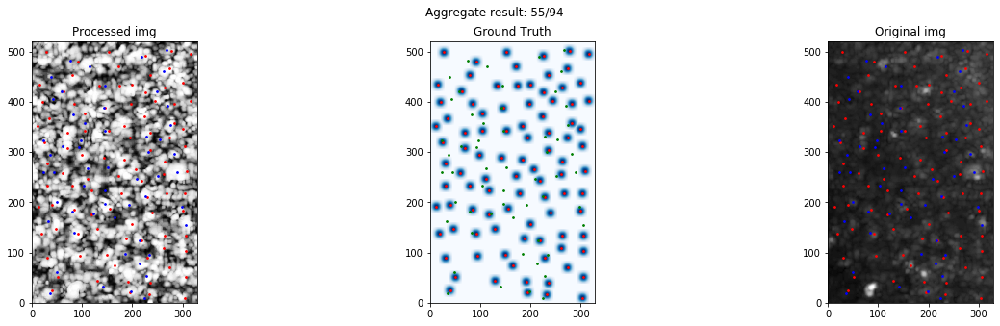

10 Moderate
11.63922895361135 1.0 42.720018726587654
83.65212201765816 1.0 394.95442775084825


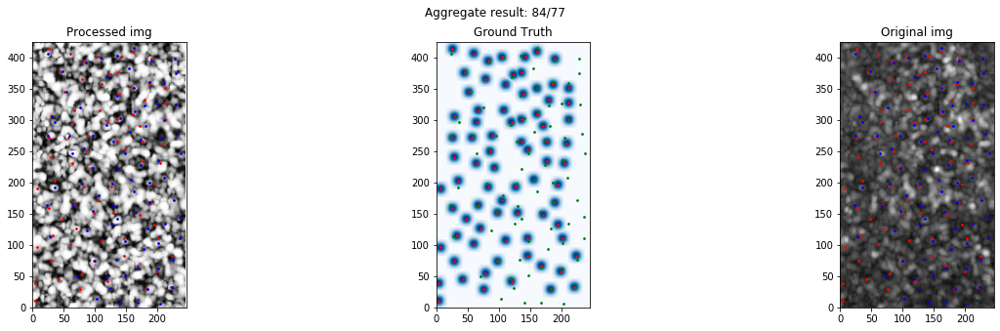

27 Mild
11.876796075838243 0.0 40.311288741492746
21.651804459994892 0.0 175.1142484208524


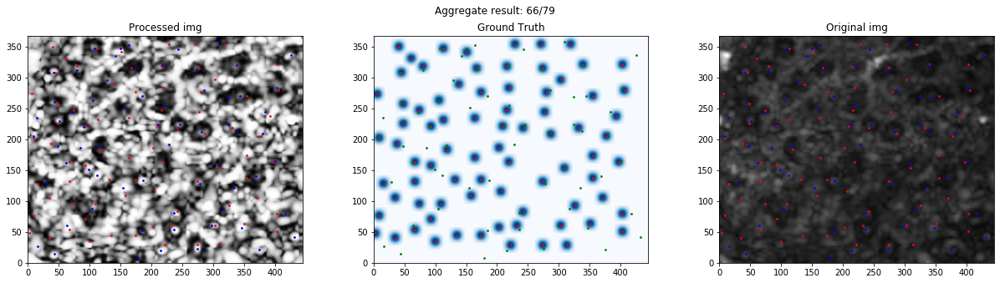

30 Mild
14.344257738179836 1.4142135623730951 37.34300469967568
36.83314887138244 2.23606797749979 161.74362429474616


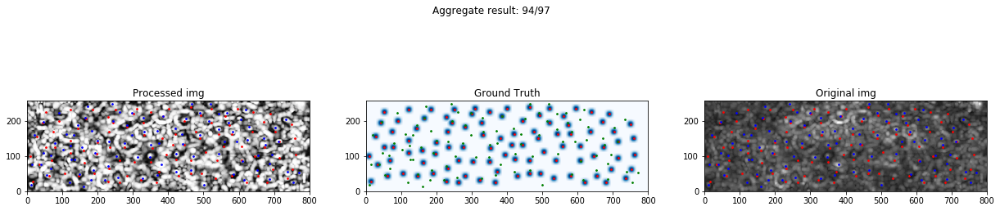

36 Control
8.867476916759752 1.0 38.07886552931954
53.6204866523105 1.0 370.7937432050331


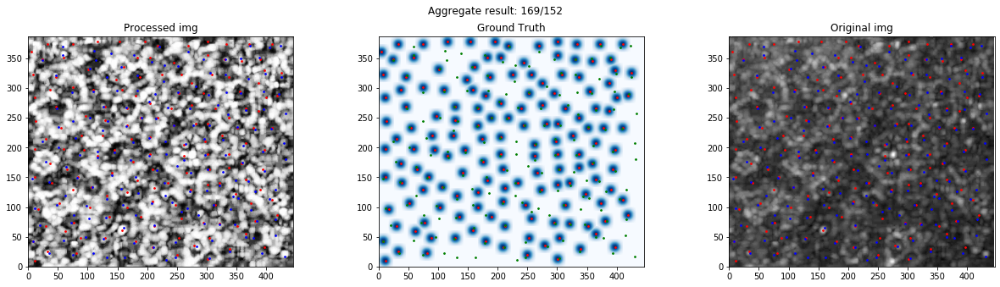

11 Moderate
12.335477390934717 1.0 37.71604433129222
73.89859668812625 1.0 546.9643498437536


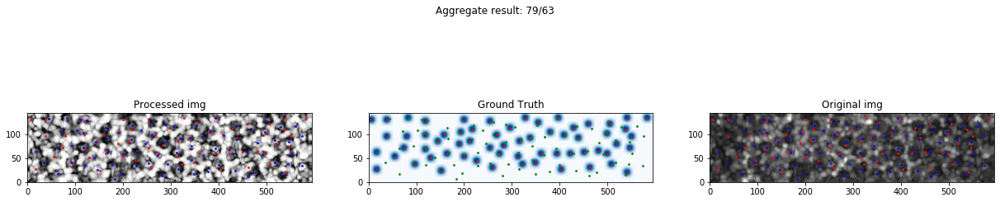

25 Mild
12.163572819753153 1.0 44.68780594300866
64.72393409553824 1.0 444.1193533274586


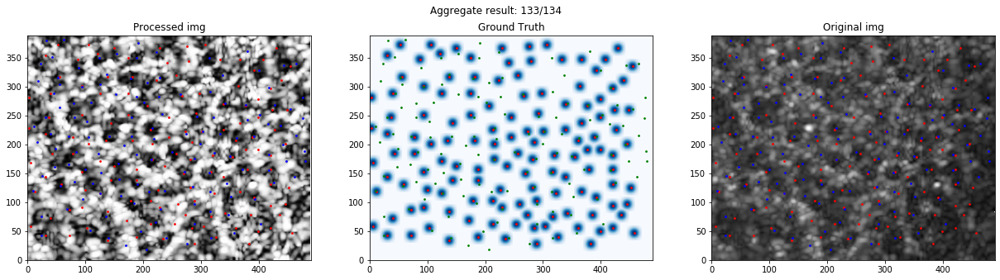

28 Mild
13.21442942127251 1.0 58.83026432033091
15.389150936696687 1.0 58.83026432033091


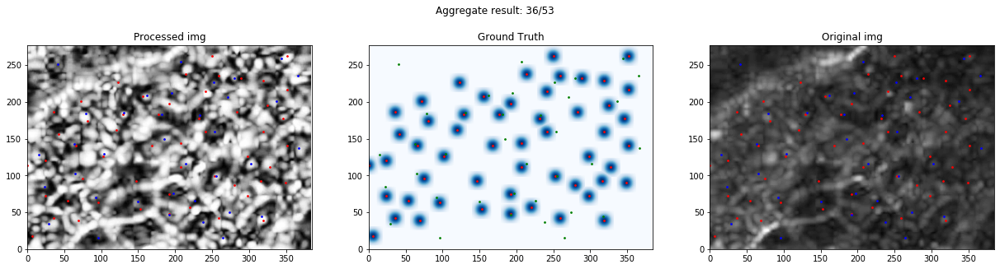

31 Control
7.405237034752971 1.0 31.78049716414141
43.90078752908499 1.0 410.95133531842913


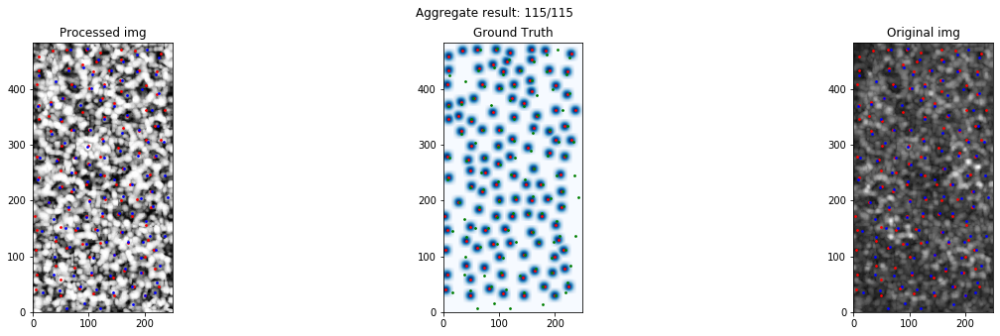

37 Control
8.58060383160432 0.9013878188659973 31.04834939252005
51.21494163711737 0.9013878188659973 345.8500397571178


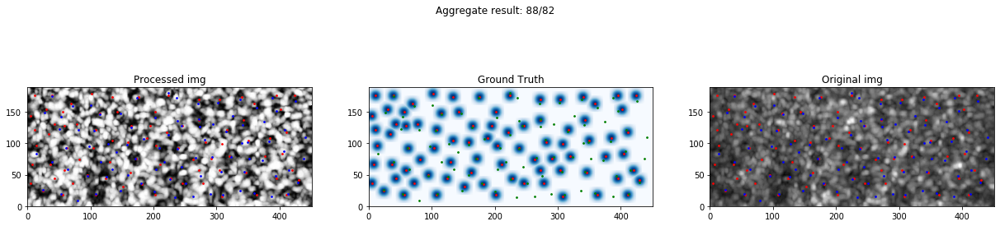

2 Severe
19.303166052024665 0.9428090415820902 47.634021455258214
81.04391919211352 4.123105625617661 599.9208281098432


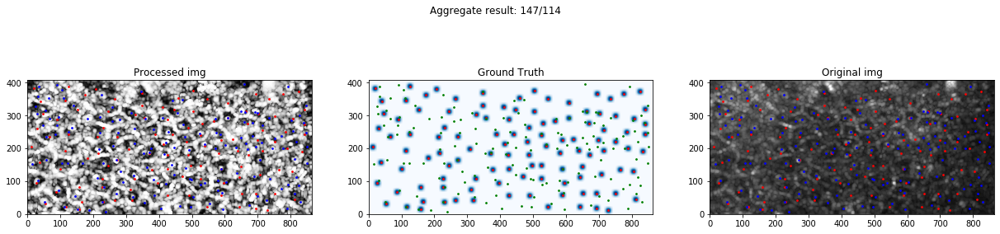

20 Mild
13.198617861882845 1.4142135623730951 38.05259518088089
55.64619514990245 1.4142135623730951 390.4180451772177


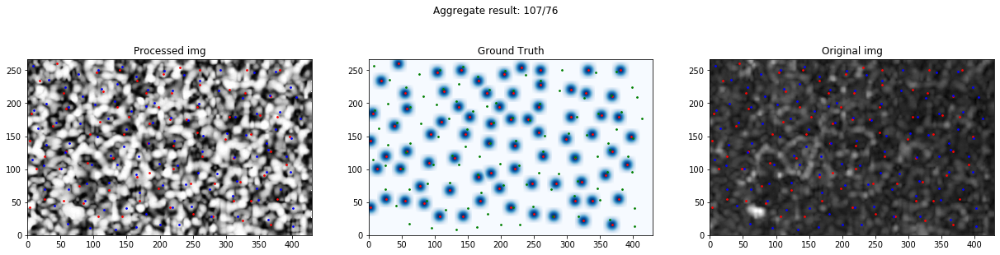

29 Mild
11.589547384233661 1.118033988749895 35.4682957019364
20.37921600099411 1.118033988749895 58.42088667591412


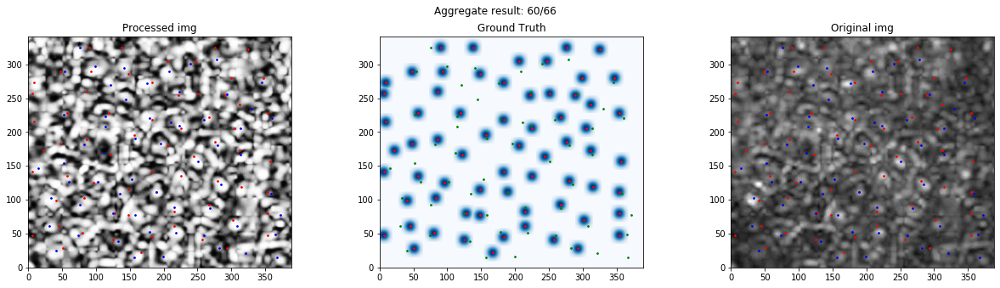

39 Control
9.205601379840292 0.5 49.39635614091387
79.38575124114041 3.0 504.3966692990746


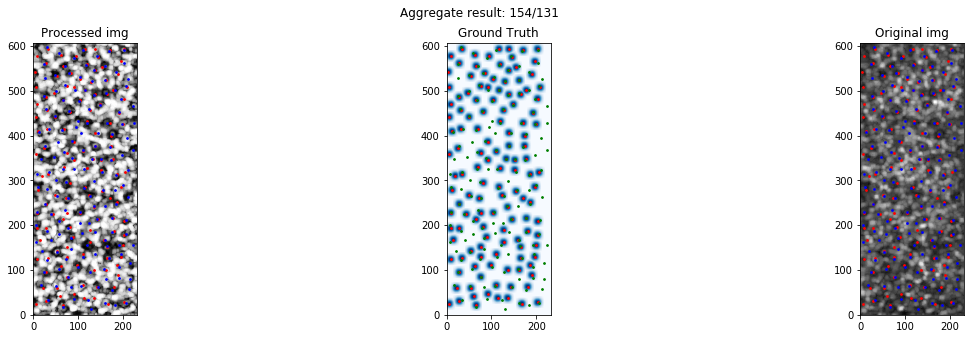

15 Moderate
13.298959391066024 3.1622776601683795 36.124783736376884
13.298959391066024 3.1622776601683795 36.124783736376884


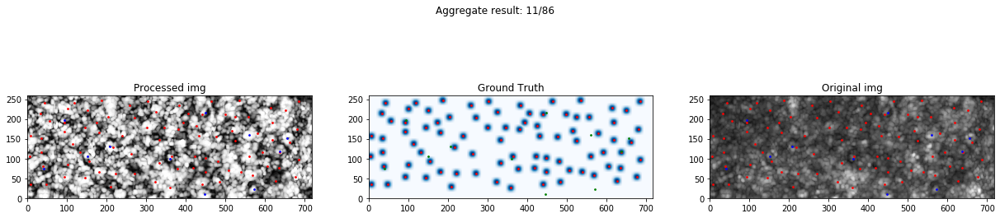

18 Moderate
12.71733401558117 2.0 38.07886552931954
12.71733401558117 2.0 38.07886552931954


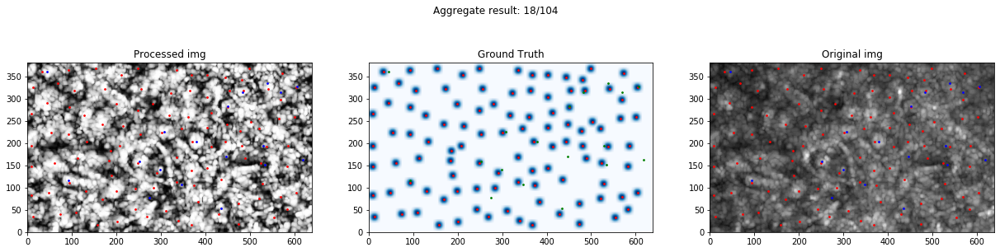

22 Mild
10.42244436839129 1.0 30.805843601498726
19.00680032671355 1.0 176.36609651517495


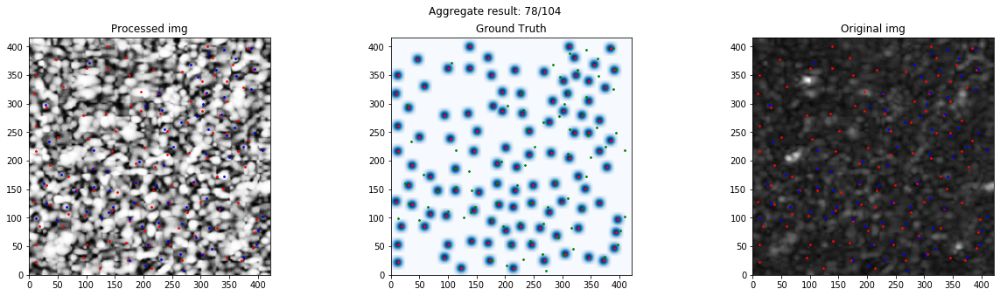

41 Control
7.428419245223163 0.7071067811865476 38.600518131237564
36.54540321806827 0.7071067811865476 283.0441661649291


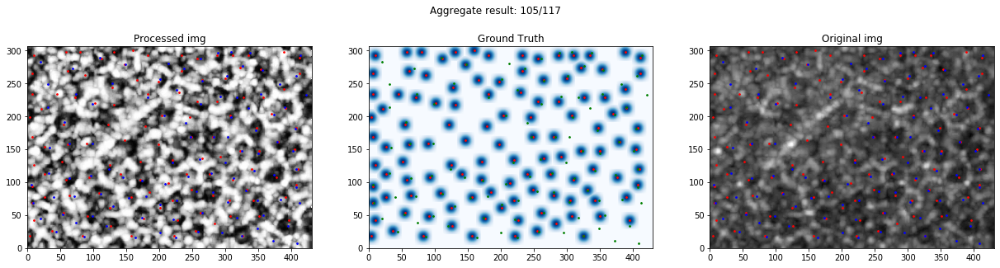

8 Severe
13.86748876522983 1.0 51.15662224971465
47.90259977259522 2.23606797749979 458.0796873907421


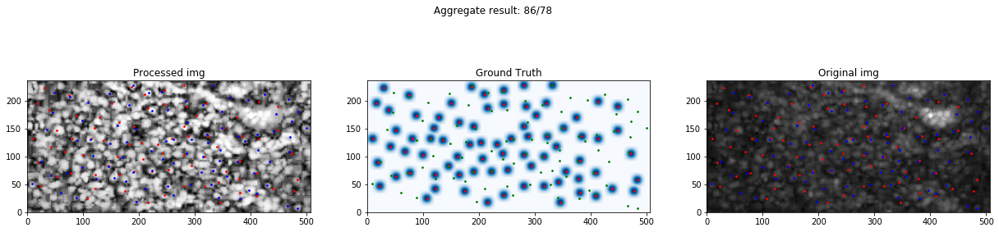

13 Moderate
14.44712689290455 1.5 49.01020301937138
56.74590048615879 3.5355339059327378 246.48326515201796


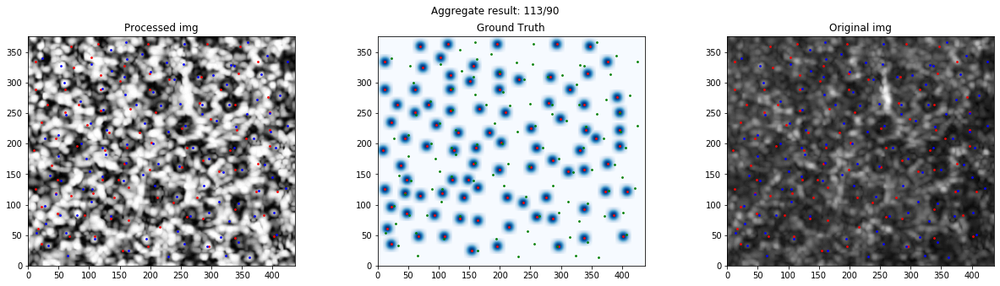

16 Moderate
17.433858301817853 3.605551275463989 36.87817782917155
20.592249639538615 3.605551275463989 37.589892258425


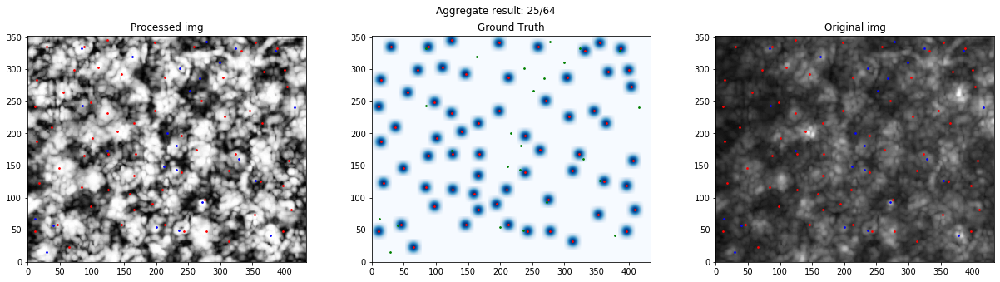

38 Control
9.315302855075057 0.0 29.769951293208393
48.34482450183994 2.0615528128088303 190.06577808748213


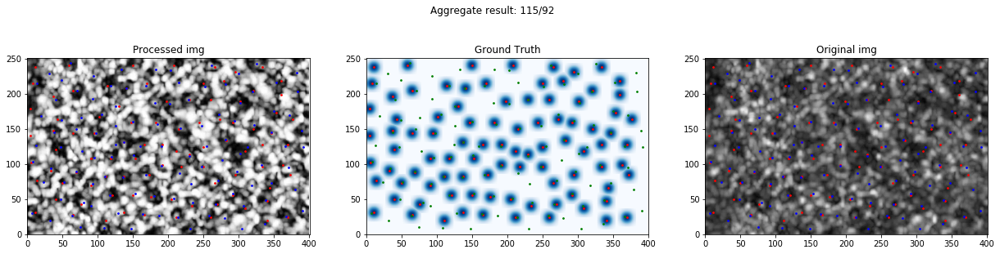

5 Severe
12.743974247080144 0.0 35.510561809129406
13.411863331660646 0.0 39.44616584663204


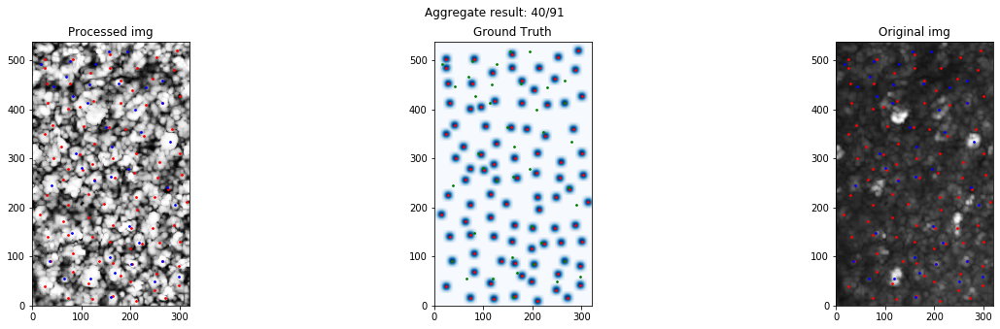

14 Moderate
14.485328861171178 0.0 33.1058907144937
19.104688971697012 0.0 107.78682665335315


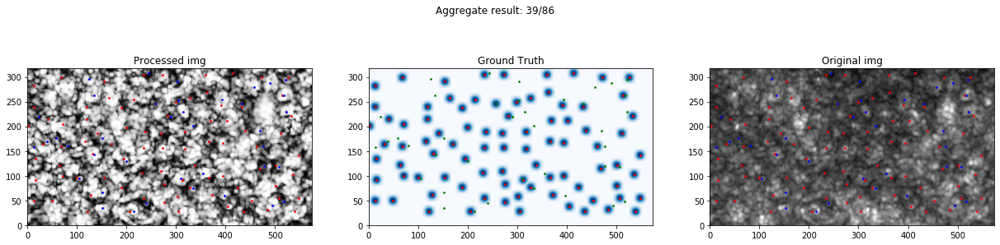

17 Moderate
18.556426527458314 1.0 60.74537019394976
35.369175037072175 2.0 106.10372283760829


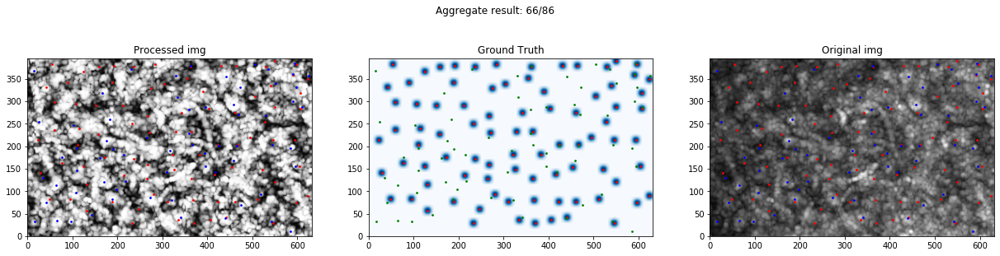

32 Control
6.907091321368542 1.0 30.265491900843113
14.496859491531252 1.0 66.88796603276258


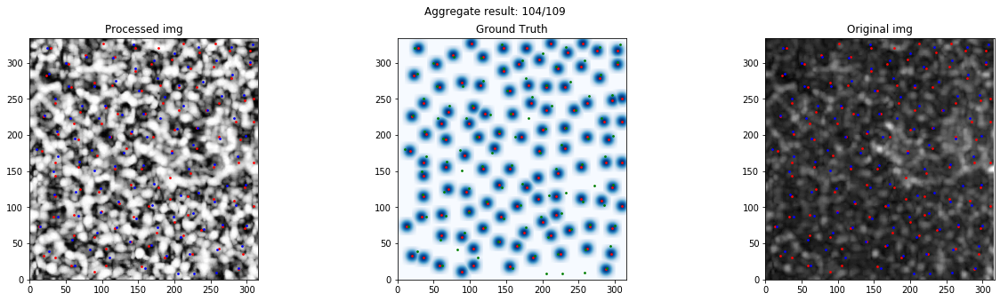

1 Severe
16.972813141958017 1.0 40.11234224026316
32.35809624623268 2.23606797749979 116.82465493208187


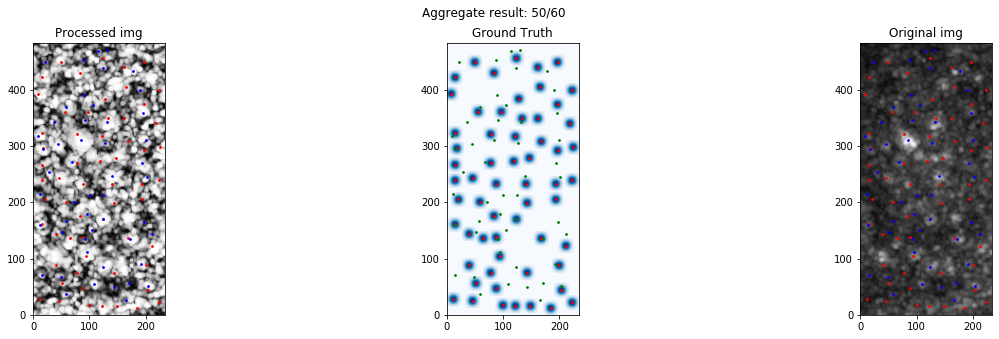

7 Severe
18.855290662752978 1.0 58.412327466040935
128.58016557031593 22.80350850198276 406.20961337713317


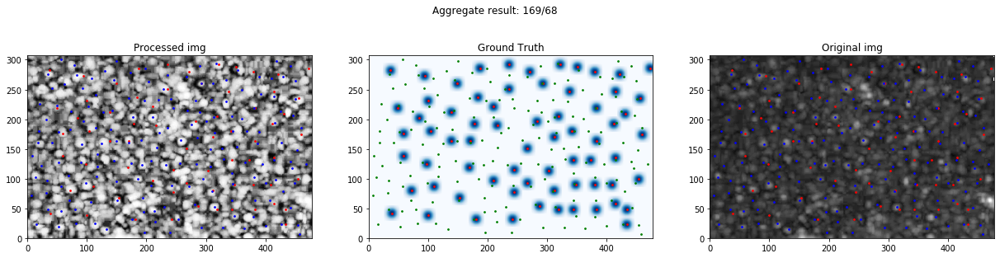

34 Control
8.39485056059185 0.0 33.54101966249684
43.88355191754449 1.0 233.5658365429328


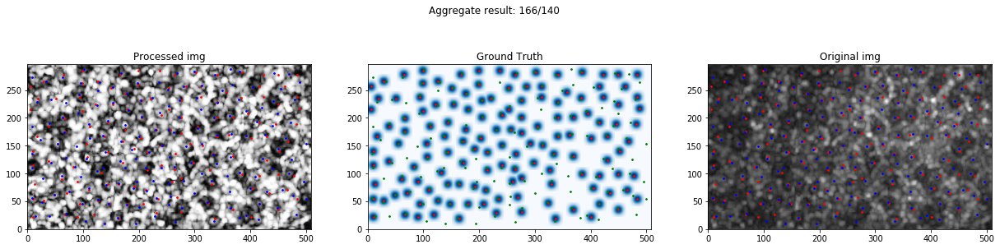

35 Control
11.072768191625704 1.0 56.22277118748239
40.52636282584544 1.0 248.9417602572939


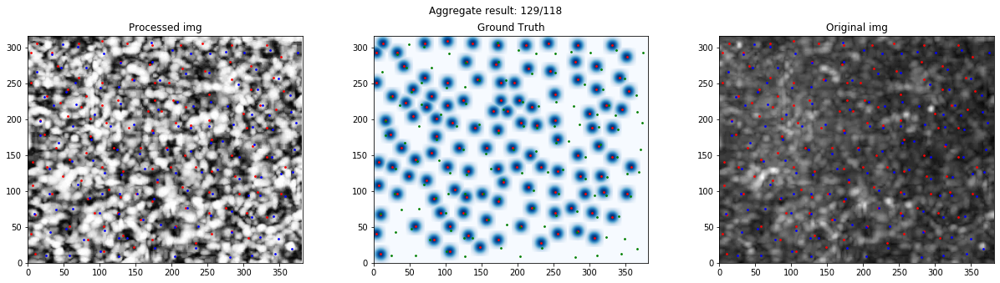

12 Moderate
14.855274633202377 1.0 50.0
49.0464069977005 3.5355339059327378 124.23868157703542


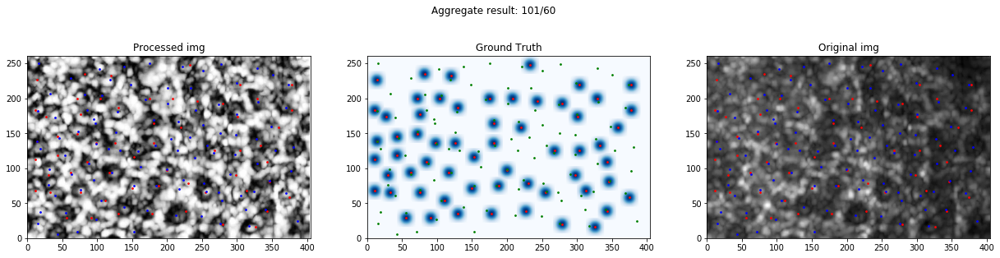

24 Mild
10.732844995863761 1.0 42.579337712087536
17.26284348821936 1.0 108.63240768757728


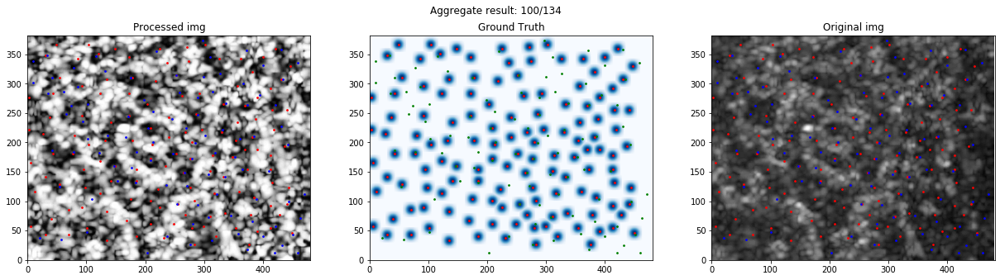

26 Mild
15.030261593015565 3.605551275463989 42.01190307520001
18.67741771090507 3.605551275463989 48.041648597857254


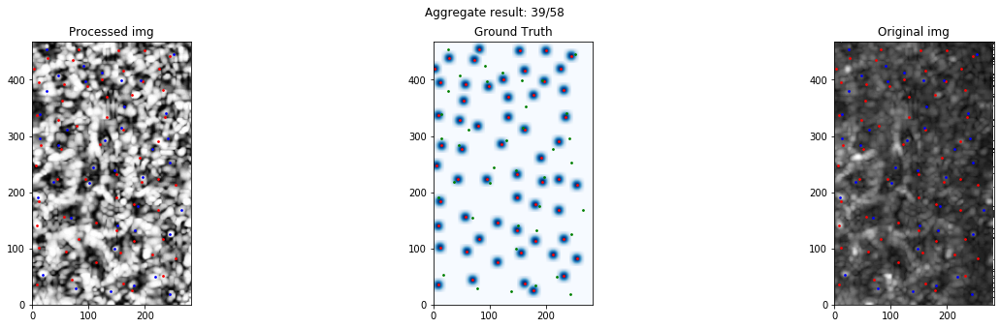

33 Control
9.524550083320499 0.7071067811865476 35.35533905932738
50.7876316373821 1.5811388300841898 304.63297589066093


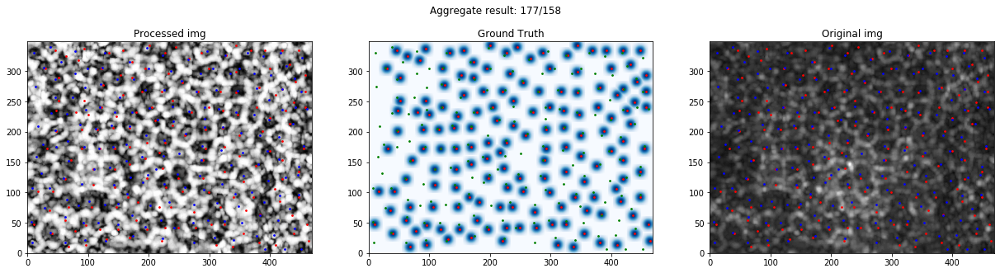

6 Severe
16.20666648957366 1.0 36.138621999185304
78.58174294849263 1.0 236.35777964771967


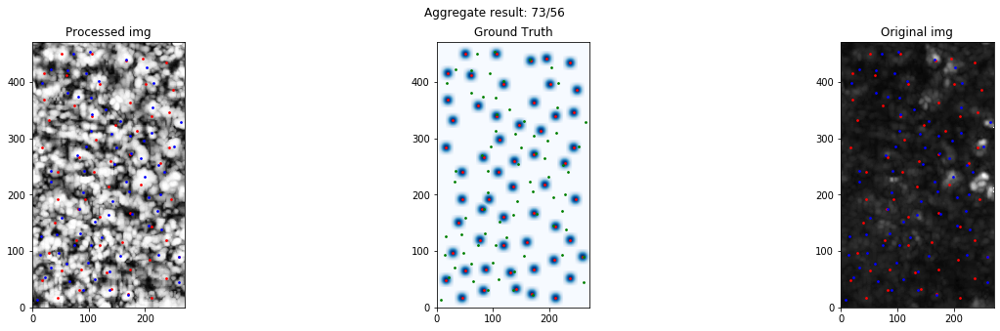

19 Moderate
17.508702053534797 1.4142135623730951 42.04759208325728
18.800534915191726 1.4142135623730951 45.221676218380054


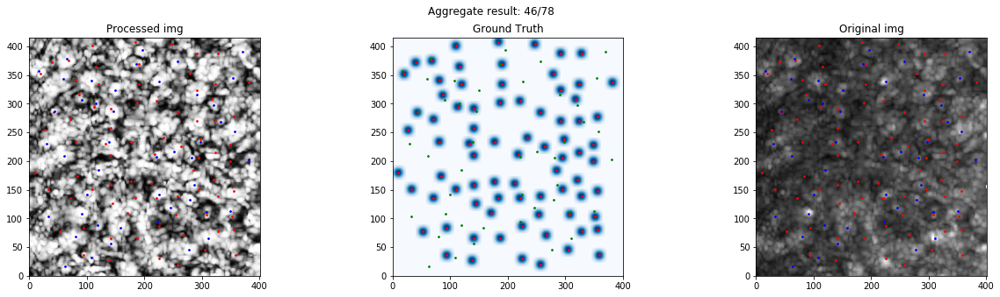

21 Mild
10.296109773360048 1.0 31.400636936215164
45.22466054678566 2.8284271247461903 185.74444810007108


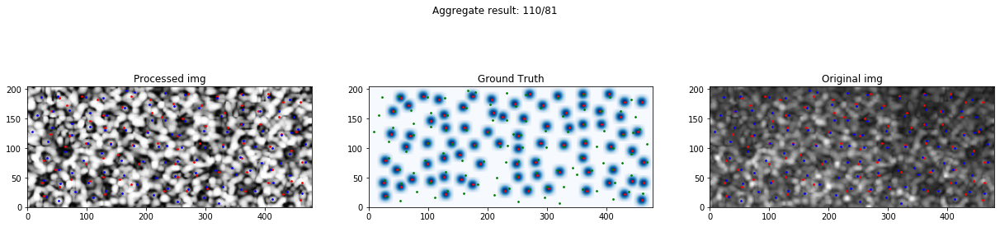

23 Mild
13.864141306604138 0.0 55.54277630799526
54.97694087863973 1.0 247.19425559668656


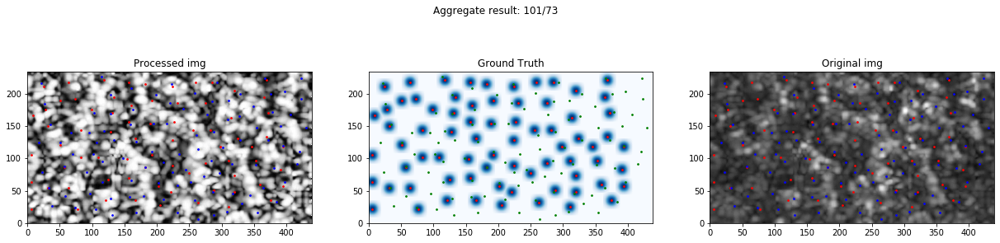

0 Severe
16.170876675554926 2.5495097567963922 39.824615503479755
76.91677704420526 2.5495097567963922 453.1942188510352


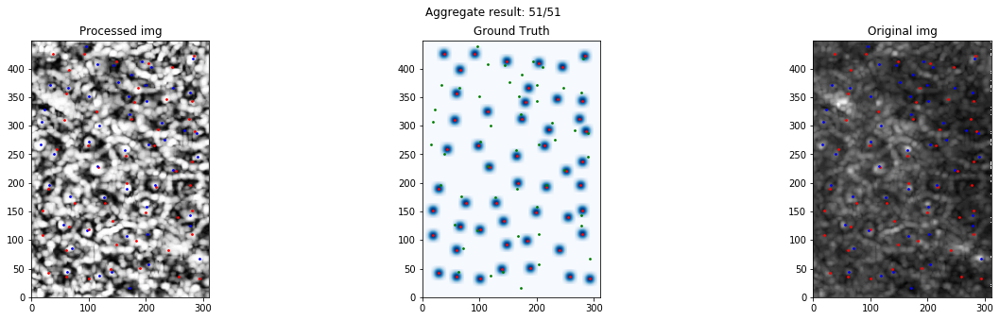

3 Severe
18.38917605841787 4.47213595499958 38.01315561749642
35.51841301489755 4.47213595499958 107.01868995647442


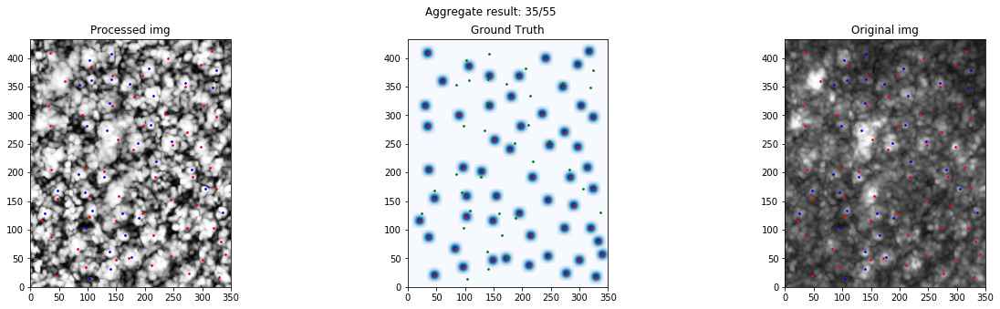

9 Moderate
7.975240961107012 0.0 33.60059523282288
35.418933147982166 2.8284271247461903 118.10588469674151


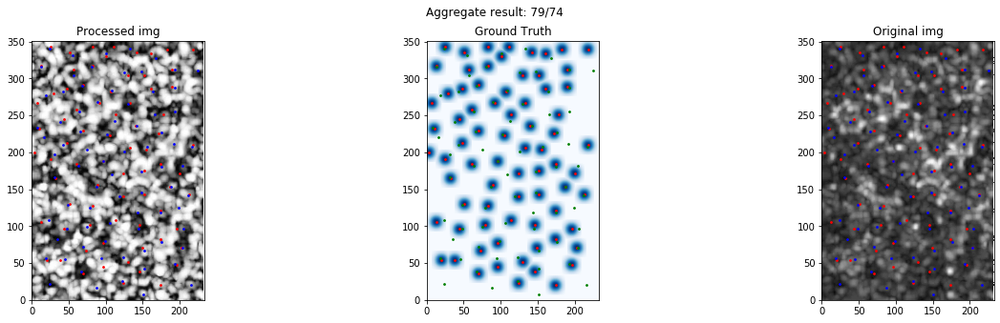

40 Control
8.729723852322548 0.5 42.43819034784589
60.48229449073617 2.0615528128088303 564.7804883315287


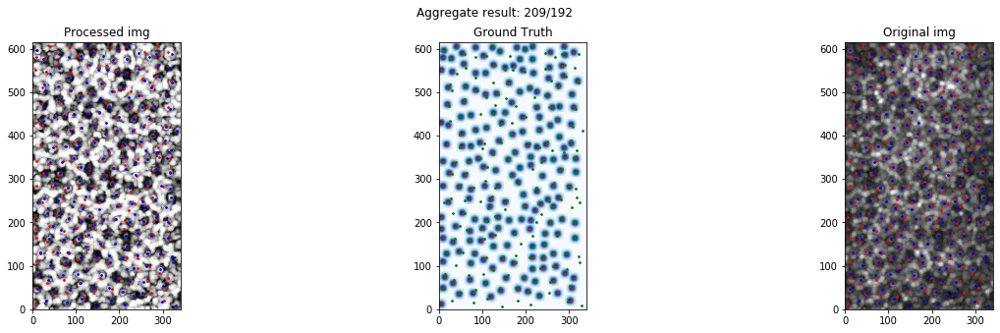

In [36]:
model_dir = Path('./models')


labels = []
labels += ['Severe'] * 9
labels += ['Moderate'] * 11
labels += ['Mild'] * 11
labels += ['Control'] * 11


y_pred = []
y_true = []
dis_dup = []
dis_non_dup = []

for i in tqdm(range(len(train_indexes))):
    model = load_model(model_dir / 'BCD_model_cv_{}.h5'.format(i+1), compile=False)
    result = predict(model, img_data, mask_data, original_img_data, test_indexes[i], labels)
    
    y_pred += result[0]
    y_true += result[1]
    dis_dup += result[2]
    dis_non_dup += result[3]

In [37]:
y_pred = np.array(y_pred)
y_true = np.array(y_true)
dis_dup = np.array(dis_dup)
dis_non_dup = np.array(dis_non_dup).flatten()

In [38]:
test_index = []
for i in test_indexes:
    for j in i:
        test_index.append(j)
        
test_index = np.array(test_index)
labels = np.array(labels)
print(test_index, labels)
print(y_pred.shape, y_true.shape, dis_dup.shape, dis_non_dup.shape)
    

[ 4 10 27 30 36 11 25 28 31 37  2 20 29 39 15 18 22 41  8 13 16 38  5 14
 17 32  1  7 34 35 12 24 26 33  6 19 21 23  0  3  9 40] ['Severe' 'Severe' 'Severe' 'Severe' 'Severe' 'Severe' 'Severe' 'Severe'
 'Severe' 'Moderate' 'Moderate' 'Moderate' 'Moderate' 'Moderate'
 'Moderate' 'Moderate' 'Moderate' 'Moderate' 'Moderate' 'Moderate' 'Mild'
 'Mild' 'Mild' 'Mild' 'Mild' 'Mild' 'Mild' 'Mild' 'Mild' 'Mild' 'Mild'
 'Control' 'Control' 'Control' 'Control' 'Control' 'Control' 'Control'
 'Control' 'Control' 'Control' 'Control']
(42,) (42,) (42,) (42,)


In [39]:
def calculate_performance(y_pred, y_true, dis_dup, dis_non_dup):
    overall_diff = np.divide(np.absolute(y_pred - y_true), y_true) * 100
    m_diff, std_diff = np.mean(overall_diff), np.std(overall_diff)
    m_dup, std_dup = np.mean(dis_dup), np.std(dis_dup)
    m_non_dup, std_non_dup = np.mean(dis_non_dup), np.std(dis_non_dup)
    
    print('Cell count error: {:.2f} {:2f}'.format(m_diff, std_diff))
    print('Distance to nearest centroid duplicated: {:.2f} {:2f}'.format(m_dup, std_dup))
    print('Distance to nearest centroid pair-wise: {:.2f} {:2f}'.format(m_non_dup, std_non_dup))

    return m_diff, std_diff, m_dup, std_dup, m_non_dup, std_non_dup

print('Overall')
overall_performance = calculate_performance(y_pred, y_true, dis_dup, dis_non_dup)

img_types = ['Severe', 'Moderate', 'Mild', 'Control']

for img_type in img_types:
    temp_pred = []
    temp_true = []
    temp_dup = []
    temp_non_dup = []

    for i in range(len(labels)):
        if labels[i] != img_type:
            continue
            
        temp_pred.append(y_pred[i])
        temp_true.append(y_true[i])
        temp_dup.append(dis_dup[i])
        temp_non_dup.append(dis_non_dup[i])
        
    
    temp_pred = np.array(temp_pred)
    temp_true = np.array(temp_true)
    temp_dup = np.array(temp_dup)
    temp_non_dup = np.array(temp_non_dup)
    print(img_type)
    calculate_performance(temp_pred, temp_true, temp_dup, temp_non_dup)
    print('\n')

Overall
Cell count error: 29.47 28.207230
Distance to nearest centroid duplicated: 12.72 3.428619
Distance to nearest centroid pair-wise: 43.40 25.108518
Severe
Cell count error: 15.50 13.826776
Distance to nearest centroid duplicated: 11.79 2.185397
Distance to nearest centroid pair-wise: 45.61 23.737281


Moderate
Cell count error: 31.33 27.099536
Distance to nearest centroid duplicated: 12.19 3.149641
Distance to nearest centroid pair-wise: 43.08 23.625516


Mild
Cell count error: 44.17 39.317522
Distance to nearest centroid duplicated: 13.60 4.022494
Distance to nearest centroid pair-wise: 40.52 30.541726


Control
Cell count error: 24.33 13.987118
Distance to nearest centroid duplicated: 13.13 3.598046
Distance to nearest centroid pair-wise: 44.79 20.995750


